<a href="https://colab.research.google.com/github/OlgaShevel/Computer-Vision-Projects/blob/main/!GradCAM_Archiv_Nerworks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

GradCam - клевый инструмент, но в сущности бесполезный, если говорить об объективности. Он показывает, что "видит" нейросеть, да и все. Ну, можно поправить гиперпараметры, например, если смотрит не туда. Так и без того можно.

Но нашла еще интересное приложение GradCam / GradCam++ - при его помощи можно просмотреть, как реально эволюционировали сверточные нейросети.

Наверняка же по-разному алгоритм GradCam работает в современных и архивных нейросетках.

Причем, к современным отнесу не хронологически - они все примерно в одно время появились (но время же в глубоком обучении идет год за три), а те сетки, что продолжают оставаться "рабочими лошадками": VGG16 (2014) и ResNet50 (2015).

Так что архивнымм уже можно назвать AlexNet (2012), NiN и ZFNet (2013). Эти сетки были важными моделями в свое время и повлияли на многие современные модели. А сейчас в чистом виде, скорее всего, не применяются. Возможно, я первая за последние годы это делаю.




Итак, возьмем все эти нейросетки, подгрузим их в качестве экстрактора признаков для задачи классификации и посмотрим, как будет себя вести GradCam на сверточных слоях каждой сетки.

А вот сравнить - опять же, объективно - невозможно. Потому и бесполезный инструмент. Нет никаких метрик у GradCam. Так что сравнение только визуальное.

**Tensorflow: VGG + GradCam++**

<IPython.core.display.Javascript object>

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 754ms/step
Predicted class index: 610
Predicted label: ('n03595614', 'jersey', np.float32(0.63006735))


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_606']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


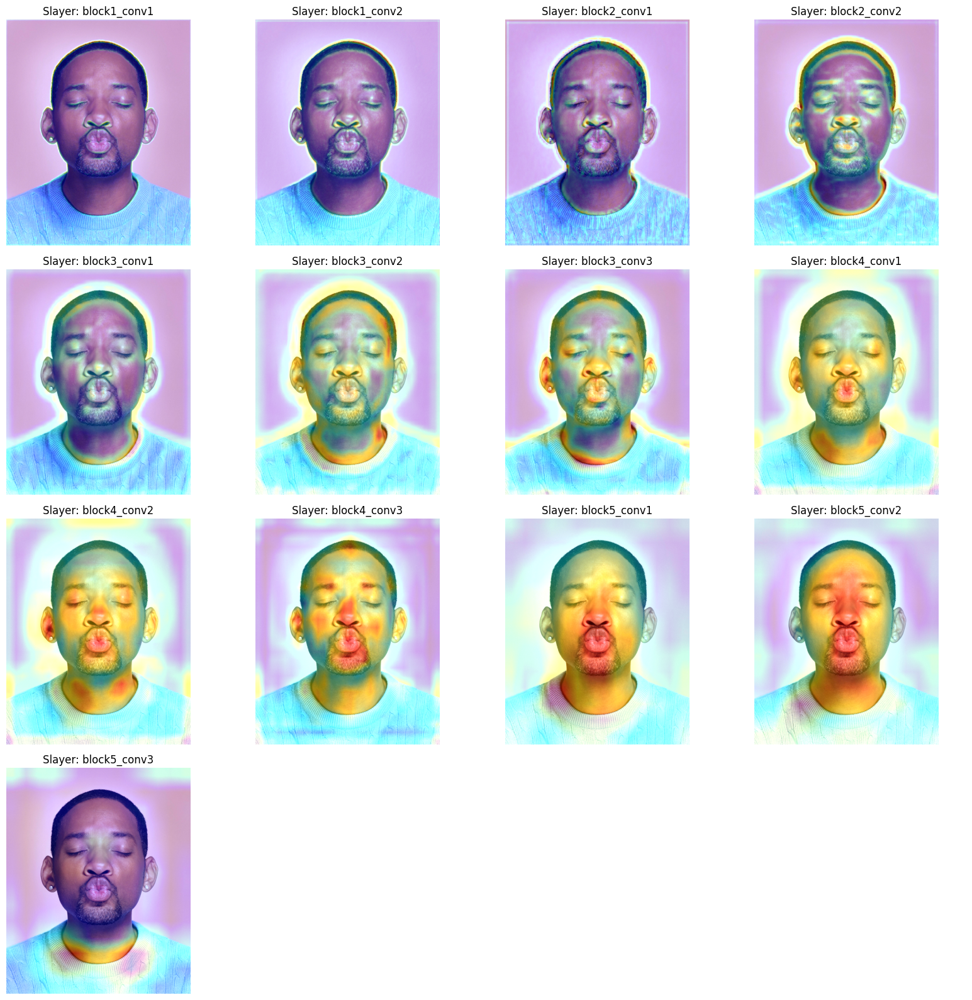

In [4]:
from google.colab import output
output.no_vertical_scroll()

import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Загрузка модели
model = tf.keras.applications.VGG16(weights='imagenet', include_top=True)

# Загрузка и подготовка изображения
img_path = '/content/actor1.jpg'  # замените на ваш путь
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = tf.keras.applications.vgg16.preprocess_input(img_array)

# Предсказание
preds = model.predict(img_array)
pred_index = tf.argmax(preds[0])
print(f"Predicted class index: {pred_index.numpy()}")
print(f"Predicted label: {tf.keras.applications.vgg16.decode_predictions(preds, top=1)[0][0]}")

# Получаем все слои с 'conv'
layers = [layer for layer in model.layers if 'conv' in layer.name]

# Создаем фигуру
num_layers = len(layers)
cols = 4
rows = int(np.ceil(num_layers / cols))
fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
axes = axes.flatten()

# Функция для Grad-CAM++ весов
def compute_grad_cam_pp(activations, grads):
    # grads: [H, W, C]
    # activations: [H, W, C]
    # Расчет
    eps = 1e-7
    # Вторые градиенты (по каналам)
    second_deriv = tf.square(grads)
    # Третьи градиенты (по каналам)
    third_deriv = grads * second_deriv
    # Средние по пространству
    alpha_num = second_deriv
    alpha_denom = 2.0 * second_deriv + tf.reduce_sum(activations * third_deriv, axis=(0,1), keepdims=True)
    alpha_denom = tf.where(alpha_denom != 0.0, alpha_denom, tf.ones_like(alpha_denom))
    alpha = alpha_num / alpha_denom
    # Веса
    weights = tf.reduce_sum(alpha * tf.nn.relu(grads), axis=(0,1))
    return weights

# Обработка каждого слоя
for i, layer in enumerate(layers):
    layer_name = layer.name
    last_conv_layer = layer

    # Создаем модель для получения выхода этого слоя
    last_conv_model = tf.keras.Model(model.inputs, last_conv_layer.output)

    # Модель для классификации после этого слоя
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for l in model.layers[model.layers.index(last_conv_layer)+1:]:
        x = l(x)
    classifier_model = tf.keras.Model(classifier_input, x)

    # Вычисляем градиенты
    with tf.GradientTape() as tape:
        last_conv_output = last_conv_model(img_array)
        tape.watch(last_conv_output)
        preds = classifier_model(last_conv_output)
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_output)

    # Получаем активы и градиенты
    activation = last_conv_output[0]
    gradient = grads[0]

    # Вычисляем веса по Grad-CAM++
    weights = compute_grad_cam_pp(activation, gradient)

    # Формируем карту
    cam = tf.reduce_sum(tf.multiply(weights, activation), axis=-1).numpy()

    # Обработка карты
    cam = np.maximum(cam, 0)
    cam /= np.max(cam) + 1e-8

    # Масштабируем к исходному изображению
    orig_img = cv2.imread(img_path)
    height, width = orig_img.shape[:2]
    heatmap_resized = cv2.resize(cam, (width, height))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    # Наложение тепловой карты
    superimposed_img = heatmap_color * 0.4 + orig_img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    # Визуализация
    axes[i].imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'Slayer: {layer_name}')
    axes[i].axis('off')

# Удаляем лишние subplot
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

**PyTorch: ResNet + GradCam++**

<IPython.core.display.Javascript object>

Predicted class index: 610
Predicted label: jersey
Probability: 0.1182


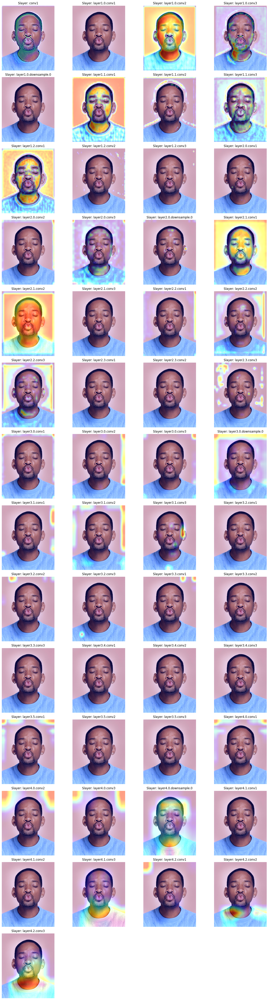

In [7]:
from google.colab import output
output.no_vertical_scroll()

import torch
import torch.nn.functional as F
import torchvision.models as models
from torchvision import transforms
from PIL import Image
import urllib.request

model = models.resnet50(pretrained=True)
model.eval()

# Загрузка и подготовка изображения
img_path = '/content/actor1.jpg'  # замените на свой путь
img = Image.open(img_path).convert('RGB')
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(img).unsqueeze(0)

# Предсказание и вывод
with torch.no_grad():
    output = model(input_tensor)
    probs = F.softmax(output, dim=1)
    pred_index = probs.argmax(dim=1)
    predicted_prob = probs[0, pred_index].item()

# Загружаем классы ImageNet
url = 'https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt'
with urllib.request.urlopen(url) as f:
    classes = [line.strip().decode('utf-8') for line in f.readlines()]

predicted_class_name = classes[pred_index.item()]

print(f"Predicted class index: {pred_index.item()}")
print(f"Predicted label: {predicted_class_name}")
print(f"Probability: {predicted_prob:.4f}")

# Предсказание
output = model(input_tensor)
pred_prob = F.softmax(output, dim=1)
pred_class = pred_prob.argmax(dim=1)

# Собираем все слои Conv2d
conv_layers = [module for name, module in model.named_modules() if isinstance(module, torch.nn.Conv2d)]

# Количество слоев
num_layers = len(conv_layers)

# Создаем субплоты точно по количеству слоев
rows = int(np.ceil(num_layers / 4))
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
axes = axes.flatten()  # делаем одномерный массив для удобства

# Объявляем переменные для хранения данных
activations = {}
gradients = {}

# Функции-хуки
def save_activation(name):
    def hook(module, input, output):
        activations[name] = output
    return hook

def save_gradient(name):
    def hook(module, grad_in, grad_out):
        gradients[name] = grad_out[0]
    return hook

# В цикле обработки каждого слоя (замените только этот блок):
for i, layer in enumerate(conv_layers):
    # Находим имя слоя
    layer_name = None
    for name, module in model.named_modules():
        if module is layer:
            layer_name = name
            break

    # Регистрация хуков
    handle_forward = layer.register_forward_hook(save_activation(layer_name))
    handle_backward = layer.register_backward_hook(save_gradient(layer_name))

    # Прямой проход и обратное распространение
    output = model(input_tensor)
    class_score = output[0, pred_class]
    model.zero_grad()
    class_score.backward()

    # Получение активизации и градиентов
    activation = activations[layer_name]
    grad = gradients[layer_name]

    # Обработка данных для Grad-CAM++
    activation_np = activation.detach().cpu().numpy()[0]
    grad_np = grad.detach().cpu().numpy()[0]

    # Расчёт весов для Grad-CAM++
    # Обратите внимание, что для Grad-CAM++ используется формула:
    # alpha_num = grad^2
    # alpha_denom = 2*grad^2 + activation * (grad^3)
    # и далее вычисляем alpha
    epsilon = 1e-8

    grad_pow_2 = grad_np ** 2
    grad_pow_3 = grad_np ** 3
    numerator = grad_pow_2
    denominator = 2 * grad_pow_2 + activation_np * grad_pow_3
    denominator = np.where(denominator != 0, denominator, np.ones_like(denominator) * epsilon)

    alphas = numerator / denominator

    # Расчёт веса
    # Для Grad-CAM++ используется сумма по каналам градиентов, взвешенная альфами
    weights = np.sum(alphas * np.maximum(grad_np, 0), axis=(1,2))

    # Построение карты
    cam = np.zeros(activation_np.shape[1:], dtype=np.float32)
    for j, w in enumerate(weights):
        cam += w * activation_np[j, :, :]

    # Нормализация
    cam = np.maximum(cam, 0)
    if np.max(cam) != 0:
        cam /= np.max(cam)

    # Масштабируем к исходному изображению
    orig_img = cv2.imread(img_path)
    height, width = orig_img.shape[:2]
    heatmap_resized = cv2.resize(cam, (width, height))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    # Наложение тепловой карты
    superimposed_img = heatmap_color * 0.4 + orig_img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    # Отображение
    axes[i].imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'Slayer: {layer_name}')
    axes[i].axis('off')

    # Удаление хуков
    handle_forward.remove()
    handle_backward.remove()

# отключаем лишние субплоты, если есть
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

Удивительно же: GradCam в обеих нейросетках забирал признаки с лица, а в итоге Уилл Смит классифицирован как свитер.

А оказывается, в ImageNet, на которых учились обе сетки, просто нет элементарных обобщающих классов типа "мужчина", "женщина", "ребенок".

Зато котики, слоны, свитеры, ботинки и прочее - есть. И больше всего собак почему-то.

In [8]:
import urllib.request

# Загружаем список классов ImageNet
url = 'https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt'
with urllib.request.urlopen(url) as f:
    classes = [line.strip().decode('utf-8') for line in f.readlines()]

# Функция для поиска по ключевым словам
def find_classes(keywords):
    results = []
    for i, class_name in enumerate(classes):
        lower_name = class_name.lower()
        if any(keyword in lower_name for keyword in keywords):
            results.append((i, class_name))
    return results

# Искать классы, связанные с "мужчиной" или "чернокожими"
keywords = ['man', 'men', 'boy', 'male', 'black', 'dark', 'african', 'nigerian', 'afro', 'african-american']

matched_classes = find_classes(keywords)

print("Найденные классы, связанные с мужчинами или чернокожими:")
for idx, name in matched_classes:
    print(f"{idx}: {name}")

Найденные классы, связанные с мужчинами или чернокожими:
25: European fire salamander
28: spotted salamander
47: African chameleon
49: African crocodile
70: harvestman
72: black and gold garden spider
75: black widow
80: black grouse
87: African grey
100: black swan
128: black stork
165: black-and-tan coonhound
210: German short-haired pointer
235: German shepherd
236: Doberman
275: African hunting dog
295: American black bear
315: mantis
359: black-footed ferret
369: siamang
386: African elephant
514: cowboy boot
515: cowboy hat
548: entertainment center
640: manhole cover
887: vestment
922: menu


**AlexNet**

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 135MB/s]


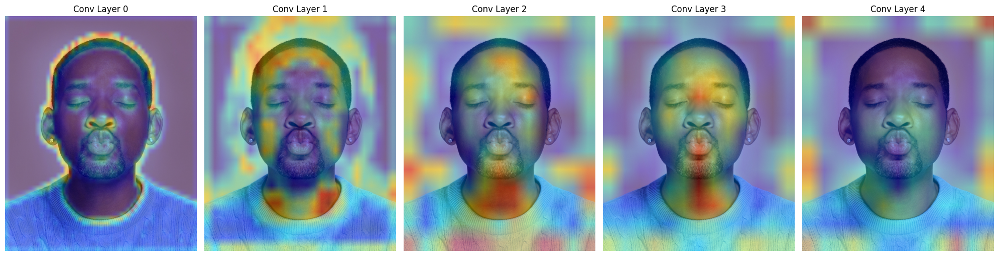

In [16]:
import torch
import torch.nn.functional as F
from torchvision import models, transforms
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

class GradCamPlusPlus:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.activations = None
        self.hook_handles = []

    def register_hooks(self, target_layer):
        for handle in self.hook_handles:
            handle.remove()
        self.hook_handles = []

        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.hook_handles.append(target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(target_layer.register_backward_hook(backward_hook))

    def generate(self, input_tensor, target_layer, class_idx=None):
        self.register_hooks(target_layer)

        output = self.model(input_tensor)
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()

        self.model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0, class_idx] = 1
        output.backward(gradient=one_hot, retain_graph=True)

        grads = self.gradients
        activations = self.activations

        grads_power_2 = grads ** 2
        grads_power_3 = grads ** 3
        sum_activations = torch.sum(activations, dim=(2, 3), keepdim=True)

        eps = 1e-8
        alpha_num = grads_power_2
        alpha_denom = 2 * grads_power_2 + sum_activations * grads_power_3
        alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom) * eps)
        alphas = alpha_num / alpha_denom

        positive_grads = F.relu(output[0, class_idx].exp() * grads)
        weights = torch.sum(alphas * positive_grads, dim=(2, 3))

        weights = weights.unsqueeze(-1).unsqueeze(-1)
        grad_cam_map = torch.sum(weights * activations, dim=1).squeeze()
        grad_cam_map = F.relu(grad_cam_map)

        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() + eps

        return grad_cam_map.detach().cpu().numpy()

# Загрузка модели и изображения
model = models.alexnet(pretrained=True)
img_path = '/content/actor1.jpg'  # замените на ваш путь
img = Image.open(img_path).convert('RGB')

# Для подачи в модель - resize до 224x224
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
input_tensor = transform(img).unsqueeze(0)

gradcam_pp = GradCamPlusPlus(model)

images_for_plot = []
original_size = img.size  # (width, height)

for i, layer in enumerate(model.features):
    if isinstance(layer, torch.nn.Conv2d):
        mask = gradcam_pp.generate(input_tensor, layer)

        # Конвертируем PIL->numpy и сохраняем оригинальный размер (width, height)
        img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

        # Масштабируем тепловую карту до оригинального размера изображения
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
        heatmap = cv2.resize(heatmap, (original_size[0], original_size[1]))

        superimposed_img = cv2.addWeighted(img_cv, 0.6, heatmap, 0.4, 0)
        images_for_plot.append(superimposed_img)

# Визуализируем все карты в одной строке с сохранением пропорций
plt.figure(figsize=(20, 6))
for idx, img_array in enumerate(images_for_plot):
    plt.subplot(1, len(images_for_plot), idx + 1)
    plt.imshow(cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f'Conv Layer {idx}')
plt.tight_layout()
plt.show()

**NiN (просто Grad-CAM)**

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Shape after features: torch.Size([1, 96, 149, 149])


<ipython-input-11-55ca1cbcb032>:110: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  heatmap = np.maximum(heatmap, 0)


Shape after features: torch.Size([1, 96, 149, 149])
Shape after features: torch.Size([1, 96, 149, 149])
Shape after features: torch.Size([1, 96, 149, 149])


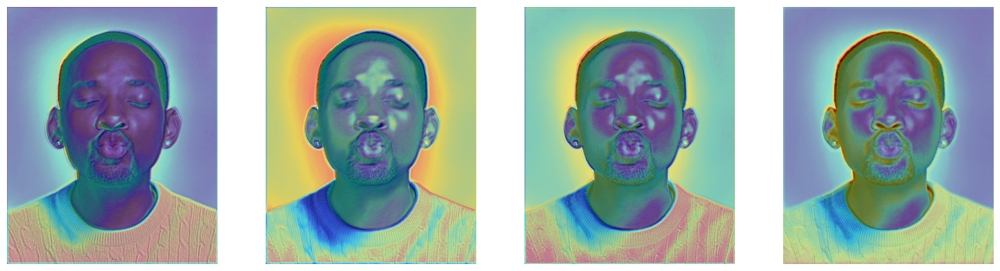

In [11]:
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

class NiN(nn.Module):
    def __init__(self, input_img_size=(300, 300)):
        super(NiN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(192, 160, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(160, 96, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),
        )
        self._auto_linear(input_img_size)

    def _auto_linear(self, input_img_size):
        dummy_input = torch.zeros(1, 3, *input_img_size)
        out = self.features(dummy_input)
        size = out.shape
        input_size = size[1] * size[2] * size[3]
        self.classifier = nn.Sequential(
            nn.Linear(input_size, 10)
        )

    def forward(self, x):
        x = self.features(x)
        print('Shape after features:', x.shape)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

# Создаем модель
model = NiN()
model.eval()

# Загрузка изображения
img_path = '/content/actor1.jpg'  # замените на ваш путь
img = Image.open(img_path)

transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

input_tensor = transform(img).unsqueeze(0)  # батч из 1

# Глобальные переменные для хранения градиентов и активаций
gradients = None
activations = None

def save_gradients(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

def get_activations_hook(module, input, output):
    global activations
    activations = output

# Создаем список для хранения изображений активаций
activation_images = []

# Проходим по каждому слою и выводим Grad-CAM
for i, layer in enumerate(model.features):
    if isinstance(layer, nn.Conv2d) or isinstance(layer, nn.MaxPool2d):
        # Регистрируем хуки
        handle_grad = layer.register_backward_hook(save_gradients)
        handle_act = layer.register_forward_hook(get_activations_hook)

        # Включаем градиенты
        input_tensor.requires_grad_(True)

        # Получаем вывод модели
        with torch.enable_grad():
            output = model(input_tensor)

        # Предсказание и подготовка к Grad-CAM
        pred_class = output.argmax(dim=1)

        # Обнуляем градиенты
        model.zero_grad()

        # Создаем one-hot маску
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0][pred_class] = 1

        # Обратное распространение
        output.backward(gradient=one_hot_output)

        # Получаем градиенты и активы
        grads = gradients.detach()
        activations = activations.detach()

        # Пуллинг градиентов
        pooled_grads = torch.mean(grads, dim=[0, 2, 3])

        # Взвешивание активов
        for j in range(activations.shape[1]):
            activations[0, j, :, :] *= pooled_grads[j]

        # Создаем тепловую карту
        heatmap = torch.mean(activations[0], dim=0).cpu()
        heatmap = np.maximum(heatmap, 0)
        heatmap /= heatmap.max()

        # Визуализация
        img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
        heatmap_resized = cv2.resize(heatmap.numpy(), (img_cv.shape[1], img_cv.shape[0]))
        heatmap_uint8 = np.uint8(255 * heatmap_resized)
        heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

        superimposed_img = cv2.addWeighted(img_cv, 0.6, heatmap_color, 0.4, 0)

        # Добавляем изображение в список
        activation_images.append(superimposed_img)

        # Удаляем хуки
        handle_grad.remove()
        handle_act.remove()

# Визуализируем все изображения в одной строке
plt.figure(figsize=(15, 4))
for idx, img_array in enumerate(activation_images):
    plt.subplot(1, len(activation_images), idx + 1)
    plt.imshow(cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB))
    plt.axis('off')
plt.tight_layout()
plt.show()



**ZFNet**

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


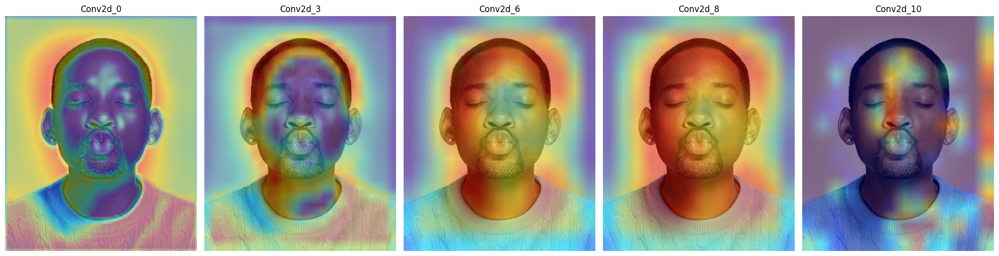

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

class ZFNet(nn.Module):
    def __init__(self, num_classes=1000):
        super(ZFNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 96, kernel_size=7, stride=2, padding=3),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Conv2d(96, 256, kernel_size=5, stride=2, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Conv2d(256, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
        )
        conv_output_size = self._get_conv_output((3, 224, 224))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(conv_output_size, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def _get_conv_output(self, shape):
        bs = 1
        input = torch.zeros(bs, *shape)
        output_feat = self.features(input)
        n_size = output_feat.view(bs, -1).size(1)
        return n_size

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

class GradCamPlusPlus:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.activations = None
        self.hook_handles = []

    def register_hooks(self, target_layer):
        for handle in self.hook_handles:
            handle.remove()
        self.hook_handles = []

        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.hook_handles.append(target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(target_layer.register_backward_hook(backward_hook))

    def generate(self, input_tensor, target_layer, class_idx=None):
        self.register_hooks(target_layer)

        output = self.model(input_tensor)
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()

        self.model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0, class_idx] = 1
        output.backward(gradient=one_hot, retain_graph=True)

        grads = self.gradients
        activations = self.activations

        grads_power_2 = grads ** 2
        grads_power_3 = grads ** 3
        sum_activations = torch.sum(activations, dim=(2, 3), keepdim=True)

        eps = 1e-8
        alpha_num = grads_power_2
        alpha_denom = 2 * grads_power_2 + sum_activations * grads_power_3
        alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom) * eps)
        alphas = alpha_num / alpha_denom

        positive_grads = F.relu(output[0, class_idx].exp() * grads)
        weights = torch.sum(alphas * positive_grads, dim=(2, 3))

        weights = weights.unsqueeze(-1).unsqueeze(-1)
        grad_cam_map = torch.sum(weights * activations, dim=1).squeeze()
        grad_cam_map = F.relu(grad_cam_map)

        grad_cam_map -= grad_cam_map.min()
        grad_cam_map /= grad_cam_map.max() + eps

        return grad_cam_map.detach().cpu().numpy()

# Загрузка изображения и подготовка
img_path = '/content/actor1.jpg'  # замените на ваш путь
img = Image.open(img_path).convert('RGB')
original_size = img.size  # (width, height)

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # для подачи в сеть
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
input_tensor = transform(img).unsqueeze(0)

model = ZFNet(num_classes=1000)
model.eval()

gradcam_pp = GradCamPlusPlus(model)

images_for_plot = []
layer_names = []

for i, layer in enumerate(model.features):
    if isinstance(layer, nn.Conv2d):
        layer_names.append(f"Conv2d_{i}")
        mask = gradcam_pp.generate(input_tensor, layer)

        img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
        heatmap = cv2.resize(heatmap, (original_size[0], original_size[1]))

        superimposed_img = cv2.addWeighted(img_cv, 0.6, heatmap, 0.4, 0)
        images_for_plot.append(superimposed_img)

# Визуализация всех Grad-CAM++ для сверточных слоев
plt.figure(figsize=(20, 6))
for idx, img_array in enumerate(images_for_plot):
    plt.subplot(1, len(images_for_plot), idx + 1)
    plt.imshow(cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(layer_names[idx])
plt.tight_layout()
plt.show()

Распознавание делать не стала, поскольку не очень толерантно у архивных получается... Скажем так - излишне анималистично.